In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
#importing data
data_train = pd.read_csv("train_transaction.csv")
data_test = pd.read_csv("test_transaction.csv")
train_identity = pd.read_csv("train_identity.csv")
test_identity = pd.read_csv("test_identity.csv")

In [3]:
# printing train and test data
print(data_train.head(5))
print(train_identity.head(5))

   TransactionID  isFraud  TransactionDT  TransactionAmt ProductCD  card1  \
0        2987002        0          86469            59.0         W   4663   
1        2987003        0          86499            50.0         W  18132   
2        2987005        0          86510            49.0         W   5937   
3        2987006        0          86522           159.0         W  12308   
4        2987008        0          86535            15.0         H   2803   

   card2  card3       card4  card5  ... V330  V331  V332  V333  V334 V335  \
0  490.0  150.0        visa  166.0  ...  NaN   NaN   NaN   NaN   NaN  NaN   
1  567.0  150.0  mastercard  117.0  ...  NaN   NaN   NaN   NaN   NaN  NaN   
2  555.0  150.0        visa  226.0  ...  NaN   NaN   NaN   NaN   NaN  NaN   
3  360.0  150.0        visa  166.0  ...  NaN   NaN   NaN   NaN   NaN  NaN   
4  100.0  150.0        visa  226.0  ...  0.0   0.0   0.0   0.0   0.0  0.0   

  V336  V337  V338  V339  
0  NaN   NaN   NaN   NaN  
1  NaN   NaN   NaN  

In [4]:
print(data_test.head(5))
print(test_identity.head(5))

   TransactionID  TransactionDT  TransactionAmt ProductCD  card1  card2  \
0        2987000          86400            68.5         W  13926    NaN   
1        2987001          86401            29.0         W   2755  404.0   
2        2987004          86506            50.0         H   4497  514.0   
3        2987007          86529           422.5         W  12695  490.0   
4        2987009          86536           117.0         W  17399  111.0   

   card3       card4  card5   card6  ...  V330  V331  V332  V333 V334 V335  \
0  150.0    discover  142.0  credit  ...   NaN   NaN   NaN   NaN  NaN  NaN   
1  150.0  mastercard  102.0  credit  ...   NaN   NaN   NaN   NaN  NaN  NaN   
2  150.0  mastercard  102.0  credit  ...   0.0   0.0   0.0   0.0  0.0  0.0   
3  150.0        visa  226.0   debit  ...   NaN   NaN   NaN   NaN  NaN  NaN   
4  150.0  mastercard  224.0   debit  ...   NaN   NaN   NaN   NaN  NaN  NaN   

   V336  V337  V338  V339  
0   NaN   NaN   NaN   NaN  
1   NaN   NaN   NaN   Na

In [5]:
# now we can see in both the tables TransactionID is common so we can merge these tables using  it
# similary we can do it for test also
train = pd.merge(data_train,train_identity,how='left', on='TransactionID',left_index=True,right_index=True)
test = pd.merge(data_test,test_identity,how='left', on='TransactionID',left_index=True,right_index=True)
print(train.head())
print(test.head())

   TransactionID  isFraud  TransactionDT  TransactionAmt ProductCD  card1  \
0        2987002        0          86469            59.0         W   4663   
1        2987003        0          86499            50.0         W  18132   
2        2987005        0          86510            49.0         W   5937   
3        2987006        0          86522           159.0         W  12308   
4        2987008        0          86535            15.0         H   2803   

   card2  card3       card4  card5  ...               id_31  id_32     id_33  \
0  490.0  150.0        visa  166.0  ...  mobile safari 11.0   32.0  1334x750   
1  567.0  150.0  mastercard  117.0  ...         chrome 62.0    NaN       NaN   
2  555.0  150.0        visa  226.0  ...         chrome 62.0   24.0  1280x800   
3  360.0  150.0        visa  166.0  ...         chrome 62.0    NaN       NaN   
4  100.0  150.0        visa  226.0  ...         chrome 62.0    NaN       NaN   

            id_34  id_35 id_36 id_37  id_38  DeviceType 

In [6]:
print(train.shape)
print(test.shape)

(354324, 434)
(236216, 433)


In [7]:
# checking no number of null values in columns
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
print(train.isnull().sum())
print(test.isnull().sum())

TransactionID          0
isFraud                0
TransactionDT          0
TransactionAmt         0
ProductCD              0
card1                  0
card2               5421
card3                992
card4               1000
card5               2577
card6                997
addr1              39482
addr2              39482
dist1             211467
dist2             331717
P_emaildomain      56750
R_emaildomain     271597
C1                     0
C2                     0
C3                     0
C4                     0
C5                     0
C6                     0
C7                     0
C8                     0
C9                     0
C10                    0
C11                    0
C12                    0
C13                    0
C14                    0
D1                   784
D2                168770
D3                157985
D4                101743
D5                186339
D6                310333
D7                330931
D8                309214
D9                309214


TransactionID          0
TransactionDT          0
TransactionAmt         0
ProductCD              0
card1                  0
card2               3512
card3                573
card4                577
card5               1682
card6                574
addr1              26224
addr2              26224
dist1             140804
dist2             221196
P_emaildomain      37706
R_emaildomain     181652
C1                     0
C2                     0
C3                     0
C4                     0
C5                     0
C6                     0
C7                     0
C8                     0
C9                     0
C10                    0
C11                    0
C12                    0
C13                    0
C14                    0
D1                   485
D2                112027
D3                104893
D4                 67179
D5                123502
D6                207020
D7                220692
D8                206400
D9                206400
D10                30169


In [8]:
#printing percerntage of null values in each column
null_var = train.isnull().sum()/train.shape[0] *100
null_var_test = test.isnull().sum()/test.shape[0] *100
print(null_var)
print(null_var_test)

TransactionID      0.000000
isFraud            0.000000
TransactionDT      0.000000
TransactionAmt     0.000000
ProductCD          0.000000
card1              0.000000
card2              1.529956
card3              0.279970
card4              0.282228
card5              0.727300
card6              0.281381
addr1             11.142909
addr2             11.142909
dist1             59.681817
dist2             93.619681
P_emaildomain     16.016414
R_emaildomain     76.652160
C1                 0.000000
C2                 0.000000
C3                 0.000000
C4                 0.000000
C5                 0.000000
C6                 0.000000
C7                 0.000000
C8                 0.000000
C9                 0.000000
C10                0.000000
C11                0.000000
C12                0.000000
C13                0.000000
C14                0.000000
D1                 0.221266
D2                47.631546
D3                44.587722
D4                28.714679
D5                52

In [9]:
# categorical features in data
x =train.select_dtypes(include=['object'])
x.columns

Index(['ProductCD', 'card4', 'card6', 'P_emaildomain', 'R_emaildomain', 'M1',
       'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'id_12', 'id_15',
       'id_16', 'id_23', 'id_27', 'id_28', 'id_29', 'id_30', 'id_31', 'id_33',
       'id_34', 'id_35', 'id_36', 'id_37', 'id_38', 'DeviceType',
       'DeviceInfo'],
      dtype='object')

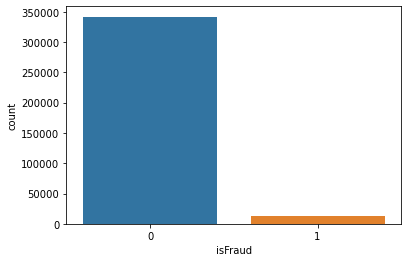

From total data  3.52 % contains fraud train
From total data  96.48 % contains legit train


In [80]:
# using countplot on isfraud we can see it is highly imbalanced data
sns.countplot(train['isFraud'])
plt.show()
print('From total data ',np.round(train[train['isFraud']==1].shape[0]/train.shape[0]*100,2),'% contains fraud train')
print('From total data ',np.round(train[train['isFraud']==0].shape[0]/train.shape[0]*100,2),'% contains legit train')

In [11]:
# transaction id is unique so we can drop this column
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
train.TransactionID.value_counts()

3147775    1
3216247    1
3547463    1
3273579    1
3261293    1
3267438    1
3226482    1
3224435    1
3541227    1
3218294    1
3238776    1
3248999    1
3572832    1
3240827    1
3230588    1
3544407    1
3234686    1
3232639    1
3058560    1
3062658    1
3271528    1
3251046    1
3187521    1
3158867    1
3185478    1
3183431    1
3551878    1
3210058    1
3208011    1
3197772    1
3156816    1
3160914    1
3146581    1
3244901    1
3150679    1
3537313    1
3565826    1
3175259    1
3162973    1
3169118    1
3257187    1
3246948    1
3060611    1
3050372    1
3543673    1
3091376    1
3113893    1
3120038    1
3117991    1
3140520    1
3138473    1
3142571    1
3132332    1
3130285    1
3089329    1
3074952    1
3095474    1
3093427    1
3541314    1
3081141    1
3085239    1
3107768    1
3111866    1
3097533    1
3115940    1
3572257    1
3122081    1
3124128    1
3079050    1
3077003    1
3066764    1
3064717    1
3068815    1
3550096    1
3023761    1
3029906    1
3027859    1

In [12]:
#deleting transaction id
del train['TransactionID']
del test['TransactionID']

### Analyzing train and test data for TransactionDT

In [13]:
train['TransactionDT'].describe()

count    3.543240e+05
mean     7.368821e+06
std      4.618388e+06
min      8.646900e+04
25%      3.024168e+06
50%      7.280034e+06
75%      1.124280e+07
max      1.581113e+07
Name: TransactionDT, dtype: float64

Text(0.5, 1.0, 'Test')

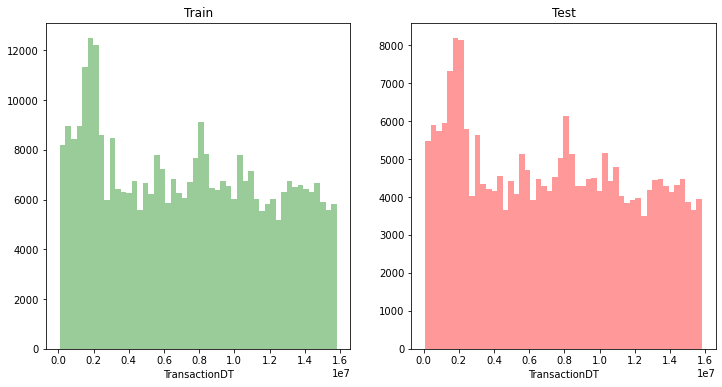

In [14]:
# plotting graph for train and test data
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.distplot(train['TransactionDT'],kde = False,color ='g' )
plt.title('Train')
plt.subplot(1,2,2)
sns.distplot(test['TransactionDT'],kde=False,color = 'r')
plt.title('Test')

#### From above plot we can see train and test data have almost same TransactionDT distribution

Text(0.5, 1.0, 'Test')

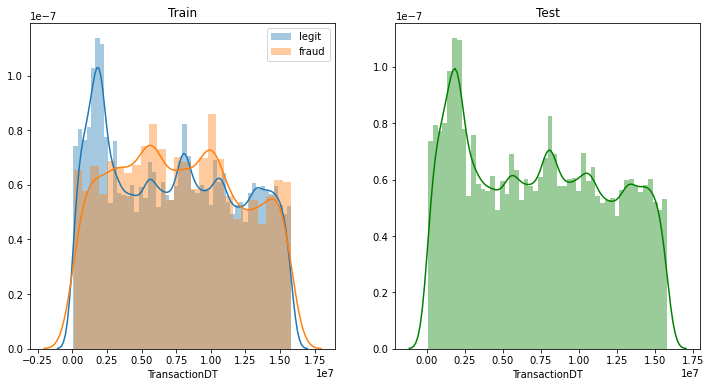

In [15]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.distplot(train[train['isFraud']==0]['TransactionDT'])
sns.distplot(train[train['isFraud']==1]['TransactionDT'])
plt.legend(['legit','fraud'])
plt.title('Train')
plt.subplot(1,2,2)
sns.distplot(test['TransactionDT'],color = 'g')
plt.title('Test')

#### From above plot we can see TransactionDT value from 0.25 to  0.75 and 0.9 t0 1.15 have greater probability  density of fraud transactions. 

### Analyzing transaction amount for train and test data

In [16]:
# checking null values in transaction amount
print(train.TransactionAmt.head(10))
print('\n')
print(train.TransactionAmt.isnull().value_counts())

0     59.000
1     50.000
2     49.000
3    159.000
4     15.000
5     75.887
6     10.500
7     57.950
8     30.000
9     47.950
Name: TransactionAmt, dtype: float64


False    354324
Name: TransactionAmt, dtype: int64


From above we can see transaction amount contains no null values

Analyzing Transaction amount and it effect on transaction being legit or fraud

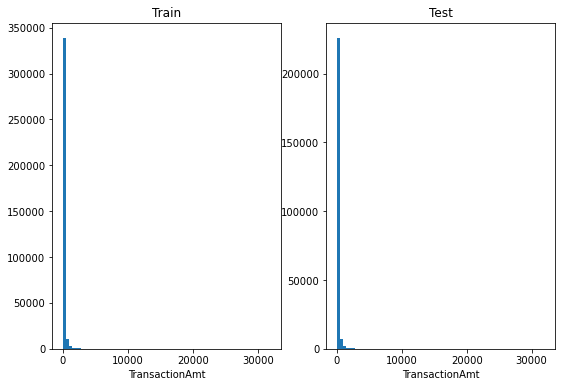

In [17]:
# plot for transaction amount
plt.figure(figsize=(9,6))
plt.subplot(1,2,1)
plt.hist(train['TransactionAmt'],bins=70,label = 'plot')
plt.title('Train')
plt.xlabel("TransactionAmt")
plt.subplot(1,2,2)
plt.hist(test['TransactionAmt'],bins=70,label = 'plot')
plt.title('Test')
plt.xlabel("TransactionAmt")
plt.show()

From above plot we see that data is skewed so we need to transform it using log transformation

In [18]:
# transforming data using log transformation
train['LogTransactionAmt'] = np.log(train['TransactionAmt'])
test['LogTransactionAmt'] = np.log(test['TransactionAmt'])

Text(0.5, 1.0, 'Test After Transformation')

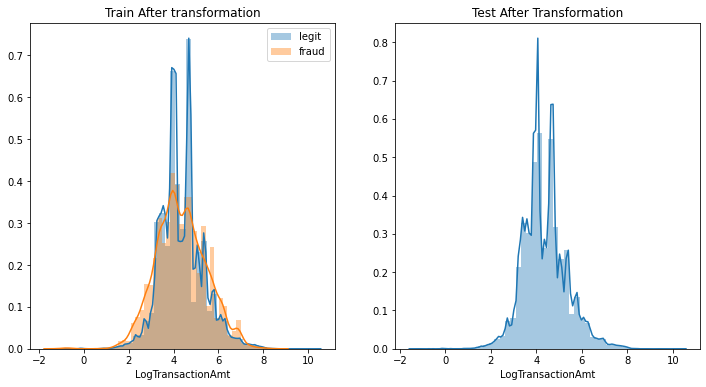

In [19]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.distplot(train[train['isFraud']==0]['LogTransactionAmt'])
sns.distplot(train[train['isFraud']==1]['LogTransactionAmt'])
plt.legend(['legit','fraud'])
plt.title('Train After transformation')
plt.subplot(1,2,2)
sns.distplot(test['LogTransactionAmt'])
plt.title('Test After Transformation')

#### From above plots we can see we have removed skewness from data and also we can note one very inetresting visualization from above plot that if transaction amount is less than 3.2  and more than 5.4 frequency of frauadlent transactions becomes high so this feature will be helpful while training the model and predicting whether a transaction is fraud or legit.

In [20]:
# delete original columns since we have added log transformed columns in data
del train['TransactionAmt']
del test['TransactionAmt']

Analyzing Product cd for train and test data 

In [21]:
#describing Product Cd
train['ProductCD'].describe()

count     354324
unique         5
top            W
freq      263463
Name: ProductCD, dtype: object

from above we can see product cd is a categorical feature with 5 unique values

In [22]:
#checking null values in ProductCd
print(train['ProductCD'].isnull().sum(axis = 0))
print(test['ProductCD'].isnull().sum(axis = 0))

0
0


product cd contains no null values.

Text(0.5, 1.0, 'Test')

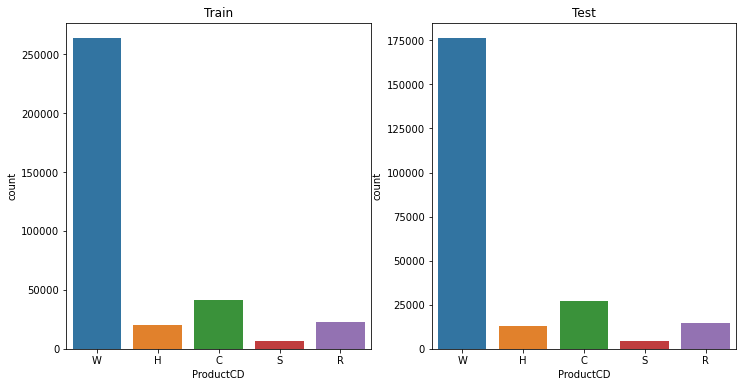

In [23]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.countplot(train['ProductCD'])
plt.title('Train')
plt.subplot(1,2,2)
sns.countplot(test['ProductCD'])
plt.title('Test')

From above plots we can see W has more no of trasactions.

Text(0.5, 1.0, 'Test')

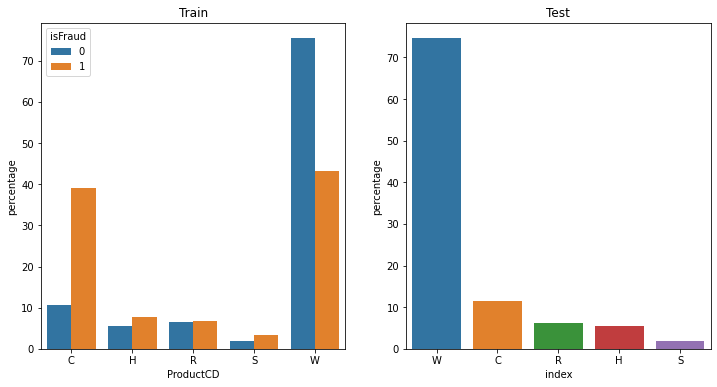

In [24]:
# plotting graph to check percentage of fraud in each unique ProductCd
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
train_ProductCD = (train[~train['ProductCD'].isnull()].groupby(['isFraud'])['ProductCD']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('ProductCD'))
sns.barplot(x="ProductCD", y="percentage", hue="isFraud", data=train_ProductCD)
plt.title('Train')
plt.subplot(1,2,2)
test_ProductCD =test[~test['ProductCD'].isnull()]['ProductCD'].value_counts(normalize=True).mul(100).rename('percentage')\
.reset_index()
sns.barplot(x="index", y="percentage", data=test_ProductCD)
plt.title('Test')

#### From above plot we see that Product Cd type "C" have majority percentage of fraud transactions so this attribute will be essential to train model. 

### Analysis of Card1-6 columns

card1:ID

card2:bank-branch in some place(NOT bank)
because many value has similar frequency
if a bank-branch don't have so much customers,I think it will be closed.
So I guess each bank has similar amounts of customers.

card3:country
because distribution of card3 is similar to dist2

card4:company of the card

card5:
bind to third party software which hold your money before you receive your goods ，ｅ.g. alipay() ，PayPal or else
because some value has the far greater frequency than others.
Note that Vesta (the host of this competition) is also the third party software company.

card5 has totally 120 values.
I guess this maybe encoded from which website or app the customer use with the 3rd-party software.
There are some websites or app is well-known but the others are not common used.

card6:credit/debit

In [25]:
card_cols = [c for c in train.columns if 'card' in c]
train[card_cols].head()

,card1,card2,card3,card4,card5,card6
0,4663,490.0,150.0,visa,166.0,debit
1,18132,567.0,150.0,mastercard,117.0,debit
2,5937,555.0,150.0,visa,226.0,debit
3,12308,360.0,150.0,visa,166.0,debit
4,2803,100.0,150.0,visa,226.0,debit


In [26]:
train[card_cols].describe()

,card1,card2,card3,card5
count,354324.000000,348903.000000,353332.000000,351747.000000
mean,9883.933259,362.755459,153.201966,199.274814
std,4902.339244,157.735513,11.336384,41.222378
min,1000.000000,100.000000,100.000000,100.000000
25%,6019.000000,215.000000,150.000000,166.000000
50%,9633.000000,361.000000,150.000000,226.000000
75%,14182.000000,512.000000,150.000000,226.000000
max,18395.000000,600.000000,231.000000,237.000000


In [27]:
train[card_cols].isnull().sum()

card1       0
card2    5421
card3     992
card4    1000
card5    2577
card6     997
dtype: int64

#### we see 2 are categorical ,4 are numerical cols , lets see their plots

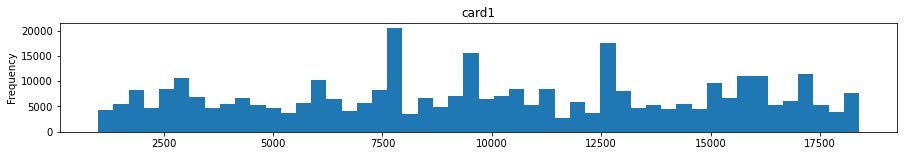

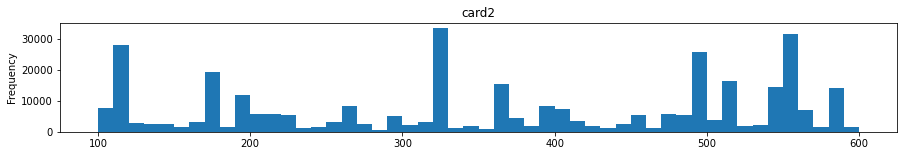

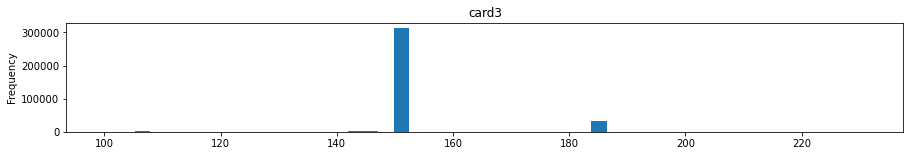

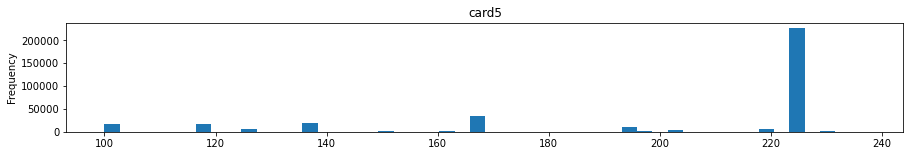

In [28]:
for c in card_cols:
    if train[c].dtype in ['float64','int64']:
        train[c].plot(kind='hist',
                                      title=c,
                                      bins=50,
                                      figsize=(15, 2))
    plt.show()

## Card 1

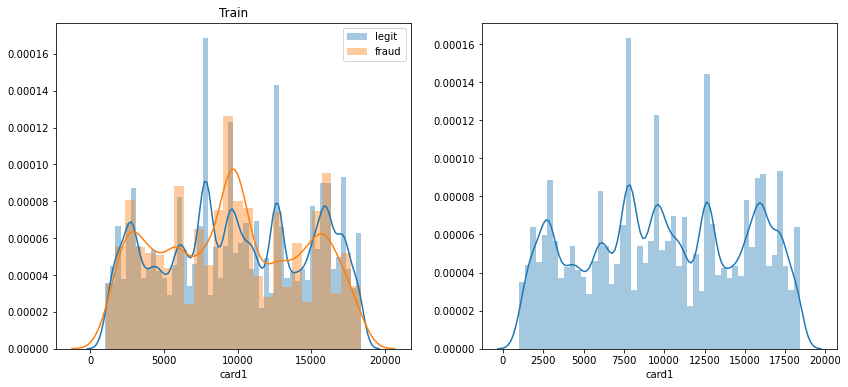

In [29]:
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
sns.distplot(train[train['isFraud']==0]['card1'])
sns.distplot(train[train['isFraud']==1]['card1'])
plt.legend(['legit','fraud'])
plt.title('Train')
plt.subplot(1,2,2)
sns.distplot(test['card1'])

## card 2

Text(0.5, 1.0, 'Test')

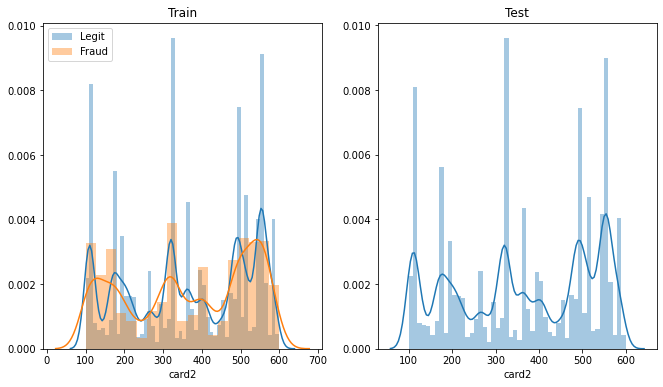

In [30]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.distplot(train[(train['isFraud']==0)]['card2'])
sns.distplot(train[(train['isFraud']==1)]['card2'])
plt.legend(['Legit','Fraud'])
plt.title('Train')
plt.subplot(1,2,2)
sns.distplot(test[~test['card2'].isnull()]['card2'])
plt.title('Test')

## card 3

C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


Text(0.5, 1.0, 'Test')

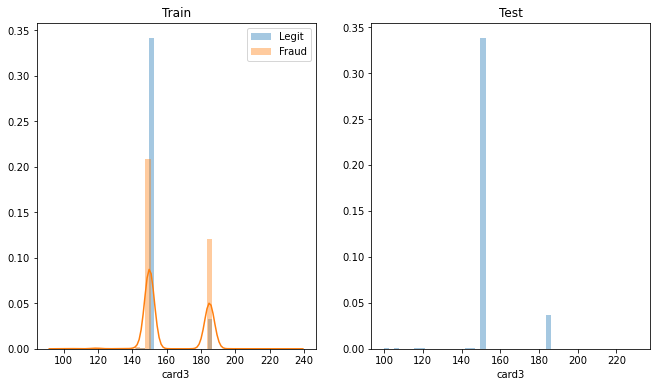

In [31]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.distplot(train[(train['isFraud']==0)]['card3'])
sns.distplot(train[(train['isFraud']==1)]['card3'])
plt.legend(['Legit','Fraud'])
plt.title('Train')
plt.subplot(1,2,2)
sns.distplot(test[~test['card3'].isnull()]['card3'])
plt.title('Test')

- From plot it can be found that card3 contains only majority of  2 values only.
- And if the value is greater than 150 the probability of transaction being fraud increases.
- We can create another feature like if the value is greater than 150 marked it as T(means fraud) otherwise F.

In [32]:
def card3Values(val):
    if val==np.nan:
        return val
    else:
        if val > 150:
            return 'T'
        else:
            return 'F'

In [33]:
train['card3Values'] = train['card3'].apply(card3Values)

In [34]:
test['card3Values'] = test['card3'].apply(card3Values)

In [35]:
train.head()

,isFraud,TransactionDT,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,LogTransactionAmt,card3Values
0,0,86469,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,287.0,NaN,outlook.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0,T,T,T,M0,F,F,F,F,F,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,100.0,NotFound,49.0,-300.0,New,NotFound,166.0,NaN,621.0,500.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,iOS 11.1.2,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device,4.077537,F
1,0,86499,W,18132,567.0,150.0,mastercard,117.0,debit,476.0,87.0,

## card 4

In [36]:
x1 = train["card4"].unique()

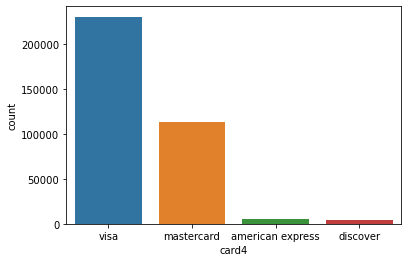

In [37]:
sns.countplot(train["card4"])

,isFraud,card4,percentage
0,0,visa,65.274824
1,0,mastercard,32.207069
2,0,american express,1.433009
3,0,discover,1.085098
4,1,visa,64.883777
5,1,mastercard,31.408349
6,1,discover,2.469235
7,1,american express,1.238639


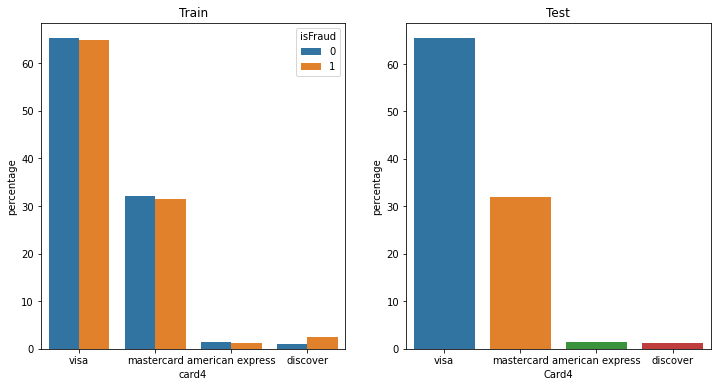

In [38]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
train_card4 = (train[~train['card4'].isnull()].groupby(['isFraud'])['card4']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
sns.barplot(x="card4", y="percentage", hue="isFraud", data=train_card4)
plt.title('Train')
plt.subplot(1,2,2)
test_card4 =test[~test['card4'].isnull()]['card4'].value_counts(normalize=True).mul(100).rename('percentage')\
.reset_index()
sns.barplot(x="index", y="percentage", data=test_card4)
plt.xlabel("Card4")
plt.title('Test')
train_card4

- Most of the transaction happend through visa card type.
- One observation is that percentage of fraud in card discover is more than the legit transaction.

## card5

Text(0.5, 1.0, 'Test')

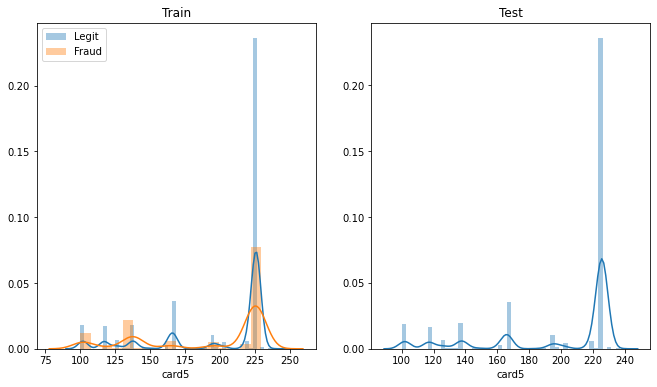

In [39]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.distplot(train[(train['isFraud']==0) & (~train['card5'].isnull())]['card5'])
sns.distplot(train[(train['isFraud']==1) & (~train['card5'].isnull())]['card5'])
plt.legend(['Legit','Fraud'])
plt.title('Train')
plt.subplot(1,2,2)
sns.distplot(test[~test['card5'].isnull()]['card5'])
plt.title('Test')

- In some intervals frquency is high for fraud and in some intervals frequency is high for legit transaction.

## card 6

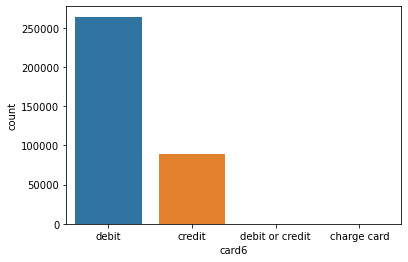

In [40]:
sns.countplot(train['card6'])

,isFraud,card6,percentage
0,0,debit,75.542179
1,0,credit,24.449607
2,0,debit or credit,0.005280
3,0,charge card,0.002933
4,1,debit,51.898022
5,1,credit,48.101978


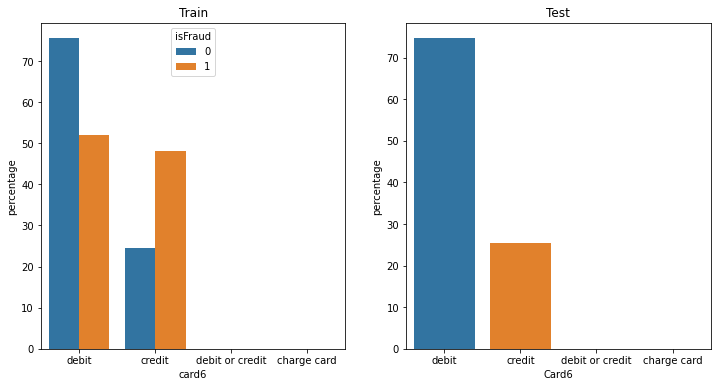

In [41]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
train_card6 = (train[~train['card6'].isnull()].groupby(['isFraud'])['card6']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
sns.barplot(x="card6", y="percentage", hue="isFraud", data=train_card6)
plt.title('Train')
plt.subplot(1,2,2)
test_card6 =test[~test['card6'].isnull()]['card6'].value_counts(normalize=True).mul(100).rename('percentage')\
.reset_index()
sns.barplot(x="index", y="percentage", data=test_card6)
plt.title('Test')
plt.xlabel("Card6")
train_card6

- Debit or credit and charge card are almost 0% in the dataset.
- Lets combine them in to other card category.
- Credit card holders tends to have more percentage of fraud transaction then legit transactions means most of fraud are done using credit card.

In [42]:
def replaceToOther(value):
    if value==np.nan:
        return value
    if value=='debit or credit' or value=='charge card':
        return 'debit'
    else:
        return value

In [43]:
train['card6'] = train['card6'].apply(replaceToOther)
test['card6'] = test['card6'].apply(replaceToOther)

Text(0.5, 1.0, 'Test')

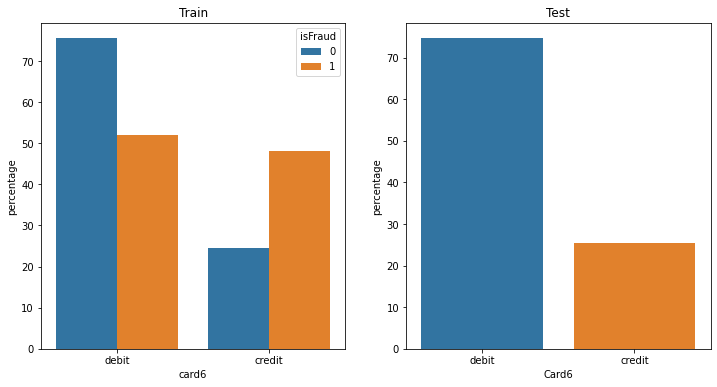

In [44]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
train_card6 = (train[~train['card6'].isnull()].groupby(['isFraud'])['card6']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
sns.barplot(x="card6", y="percentage", hue="isFraud", data=train_card6)
plt.title('Train')
plt.subplot(1,2,2)
test_card6 =test[~test['card6'].isnull()]['card6'].value_counts(normalize=True).mul(100).rename('percentage')\
.reset_index()
sns.barplot(x="index", y="percentage", data=test_card6)
plt.xlabel("Card6")
plt.title('Test')

### Analysis of device type vs fraud

In [45]:
# describing device type attribute 
train['DeviceType'].describe()

count       84892
unique          2
top       desktop
freq        51329
Name: DeviceType, dtype: object

#### we can see that device type attribute consists of two unique values and is a categorical feature

In [46]:
#checking null values in ProductCd
print(train['DeviceType'].isnull().sum(axis = 0))
print(test['DeviceType'].isnull().sum(axis = 0))

269432
180298


Text(0.5, 1.0, 'Test')

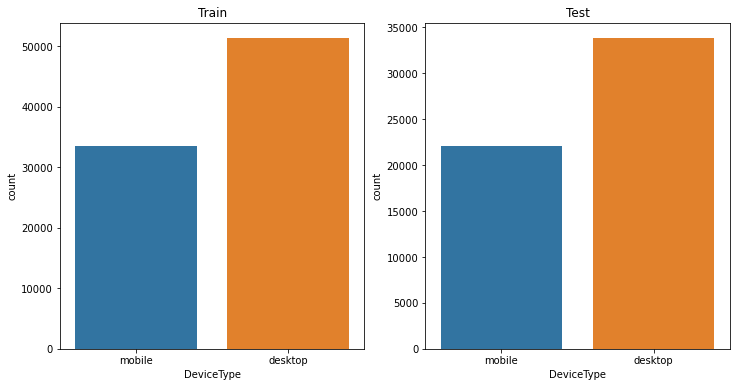

In [47]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.countplot(train['DeviceType'])
plt.title('Train')
plt.subplot(1,2,2)
sns.countplot(test['DeviceType'])
plt.title('Test')

#### From above plot we can see majority of transactions are done through dekstop

Text(0.5, 1.0, 'Test')

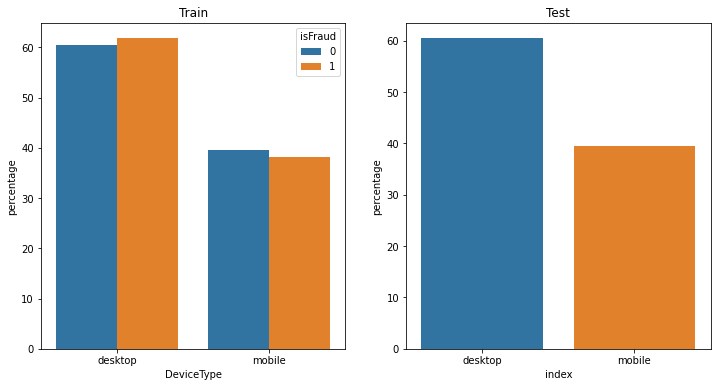

In [48]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
train_devicetype = (train[~train['DeviceType'].isnull()].groupby(['isFraud'])['DeviceType']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
sns.barplot(x="DeviceType", y="percentage", hue="isFraud", data=train_devicetype)
plt.title('Train')
plt.subplot(1,2,2)
test_devicetype =test[~test['DeviceType'].isnull()]['DeviceType'].value_counts(normalize=True).mul(100).rename('percentage')\
.reset_index()
sns.barplot(x="index", y="percentage", data=test_devicetype)
plt.title('Test')

#### From the above plot we can see dekstop and mobile almost have same percentage of fraud and legit transactions hence it doesnot provide us any important imformation and can be excluded while training model. 

In [49]:
# deleting device type attribute
del train['DeviceType']
del test['DeviceType']

### Analysis of device info

In [50]:
# describing device info
train['DeviceInfo'].describe()

count       71634
unique       1570
top       Windows
freq        28732
Name: DeviceInfo, dtype: object

In [51]:
# checking null value
print(train['DeviceInfo'].isnull().sum(axis = 0))
print(test['DeviceInfo'].isnull().sum(axis = 0))

282690
189184


In [52]:
#counting sum of device info of each type 
y = train['DeviceInfo'].value_counts()
y

Windows                                        28732
iOS Device                                     12022
MacOS                                           7595
Trident/7.0                                     4527
rv:11.0                                         1148
rv:57.0                                          572
SM-J700M Build/MMB29K                            337
SM-G610M Build/MMB29K                            285
SM-G531H Build/LMY48B                            252
rv:59.0                                          222
ALE-L23 Build/HuaweiALE-L23                      200
SM-G935F Build/NRD90M                            198
SM-G532M Build/MMB29T                            195
SM-G955U Build/NRD90M                            191
rv:58.0                                          175
SM-G950U Build/NRD90M                            172
SM-G930V Build/NRD90M                            156
rv:52.0                                          146
SAMSUNG                                       

In [53]:
#top used devices info
top_devices = y[0:9]

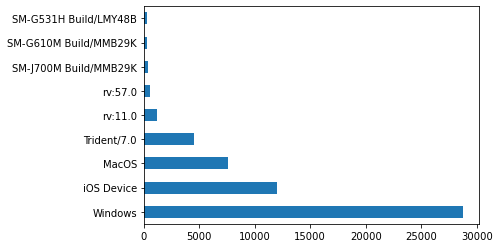

In [54]:
#plot 
top_devices.plot.barh(stacked=True)

In [55]:
top_devices

Windows                  28732
iOS Device               12022
MacOS                     7595
Trident/7.0               4527
rv:11.0                   1148
rv:57.0                    572
SM-J700M Build/MMB29K      337
SM-G610M Build/MMB29K      285
SM-G531H Build/LMY48B      252
Name: DeviceInfo, dtype: int64

In [56]:
df = train.loc[train['DeviceInfo'].isin(['Windows','iOS Device','MacOS','Trident/7.0','rv:11.0','rv:57.0'])]
df.head(10)

,isFraud,TransactionDT,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceInfo,LogTransactionAmt,card3Values
0,0,86469,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,287.0,NaN,outlook.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0,T,T,T,M0,F,F,F,F,F,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,100.0,NotFound,49.0,-300.0,New,NotFound,166.0,NaN,621.0,500.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,iOS 11.1.2,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,iOS Device,4.077537

Text(0.5, 1.0, 'Train')

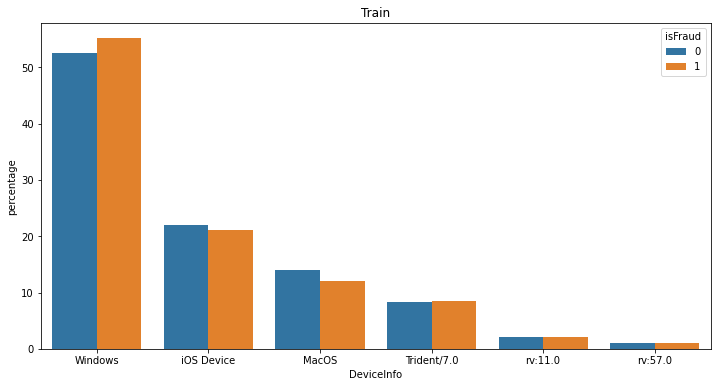

In [57]:
plt.figure(figsize=(12,6))

train_deviceInfo = (df[~df['DeviceInfo'].isnull()].groupby(['isFraud'])['DeviceInfo']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
sns.barplot(x="DeviceInfo", y="percentage", hue="isFraud", data=train_deviceInfo)
plt.title('Train')


#### From the above plot we can see all top device info  have almost same percentage of fraud and legit transactions hence it doesnot provide us any important imformation and can be excluded while training model. 

In [58]:
#deleting columns
del train['DeviceInfo']
del test['DeviceInfo']

### Analyzing addr1 and addr2 attribute here addr1 represent billing zip addr2 represents billing country

In [59]:
train['addr1'].describe()

count    314842.000000
mean        290.712989
std         101.857741
min         100.000000
25%         204.000000
50%         299.000000
75%         330.000000
max         540.000000
Name: addr1, dtype: float64

In [60]:
# checking null values
print(train['addr1'].isnull().sum(axis = 0))
print(test['addr1'].isnull().sum(axis = 0))

39482
26224


Text(0.5, 1.0, 'Test')

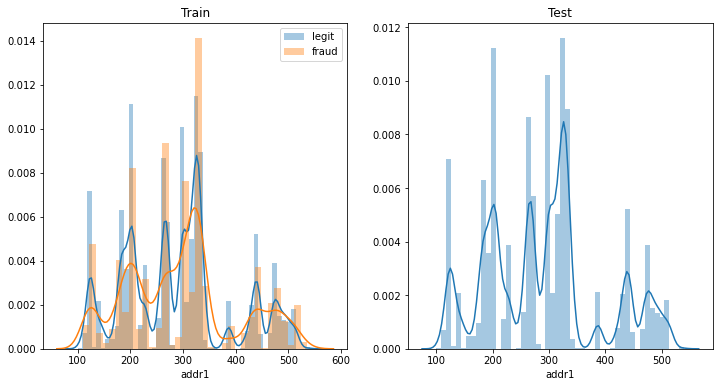

In [61]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.distplot(train[(train['isFraud']==0)]['addr1'])
sns.distplot(train[(train['isFraud']==1)]['addr1'])
plt.legend(['legit','fraud'])
plt.title('Train')
plt.subplot(1,2,2)
sns.distplot(test['addr1'])
plt.title('Test')

#### From the above plot we can see for some value of addr1(zipcode)  rate of fraud transaction is high like from value 220-250 ,350-380 so it will be important parameter while training the model.

In [62]:
train['addr2'].describe()

count    314842.000000
mean         86.804712
std           2.681134
min          10.000000
25%          87.000000
50%          87.000000
75%          87.000000
max         102.000000
Name: addr2, dtype: float64

#### we can see that majority of transaction has a value 87 for addr2 it means data consists trasaction data mainly from one country

In [63]:
# checking null values
print(train['addr2'].isnull().sum(axis = 0))
print(test['addr2'].isnull().sum(axis = 0))

39482
26224


C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


Text(0.5, 1.0, 'Test')

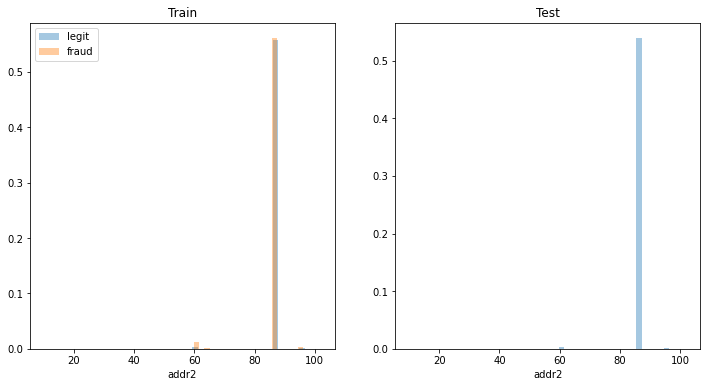

In [64]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.distplot(train[(train['isFraud']==0)]['addr2'])
sns.distplot(train[(train['isFraud']==1)]['addr2'])
plt.legend(['legit','fraud'])
plt.title('Train')
plt.subplot(1,2,2)
sns.distplot(test['addr2'])
plt.title('Test')

#### from above plot we can see majority values of transaction  is 87 and rate of fraud and legit transaction is almost equal for 87 but for value 60 fraud rate is high

In [65]:
df = train.loc[train['addr2'].isin([60,87])]
df.head(100)

,isFraud,TransactionDT,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,LogTransactionAmt,card3Values
0,0,86469,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,287.0,NaN,outlook.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0,T,T,T,M0,F,F,F,F,F,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,100.000000,NotFound,49.0,-300.0,New,NotFound,166.0,NaN,621.0,500.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,iOS 11.1.2,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,4.077537,F

Text(0.5, 1.0, 'Train')

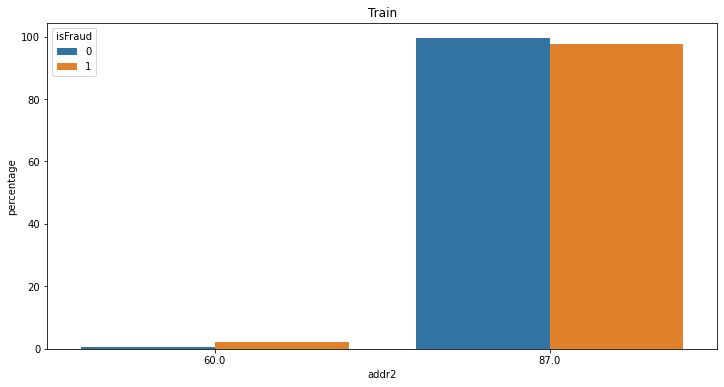

In [66]:
plt.figure(figsize=(12,6))

train_addr2 = (df[~df['addr2'].isnull()].groupby(['isFraud'])['addr2']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
sns.barplot(x="addr2", y="percentage", hue="isFraud", data=train_addr2)
plt.title('Train')

#### From above plot we can see that that percentage of fraud transaction for addr2 value 60 is high so it will be important parameter in training model

#### As we have seen majority of transactions are having value 87 so we can replace NULL values with 87

In [67]:
# filling null values for train and test data
train['addr2'].fillna(87,inplace = True)
test['addr2'].fillna(87,inplace = True)
print(train['addr2'].isnull().sum(axis = 0))

0


### Analyzing dist1 ,dist2 attributes

In [68]:
train['dist1'].describe()

count    142857.000000
mean        118.817755
std         373.764372
min           0.000000
25%           3.000000
50%           8.000000
75%          24.000000
max       10286.000000
Name: dist1, dtype: float64

In [69]:
# checking null values
print(train['dist1'].isnull().sum(axis = 0))
print(test['dist1'].isnull().sum(axis = 0))

211467
140804


C:\Users\shivam\anaconda\lib\site-packages\numpy\lib\histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\shivam\anaconda\lib\site-packages\numpy\lib\histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


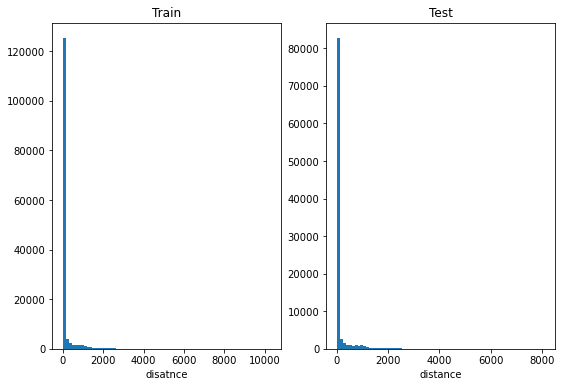

In [70]:
# plot for dist1
plt.figure(figsize=(9,6))
plt.subplot(1,2,1)
plt.hist(train['dist1'],bins=70,label = 'plot')
plt.title('Train')
plt.xlabel("disatnce")
plt.subplot(1,2,2)
plt.hist(test['dist1'],bins=70,label = 'plot')
plt.title('Test')
plt.xlabel("distance")
plt.show()

#### As we can see from plot dist1 is highly skewed so we need to tranform it using log tranformation

In [71]:
# transforming data using log transformation
train['Logdist1'] = np.log(train['dist1']+1)
test['Logdist1'] = np.log(test['dist1']+1)

Text(0.5, 1.0, 'Test After Transformation')

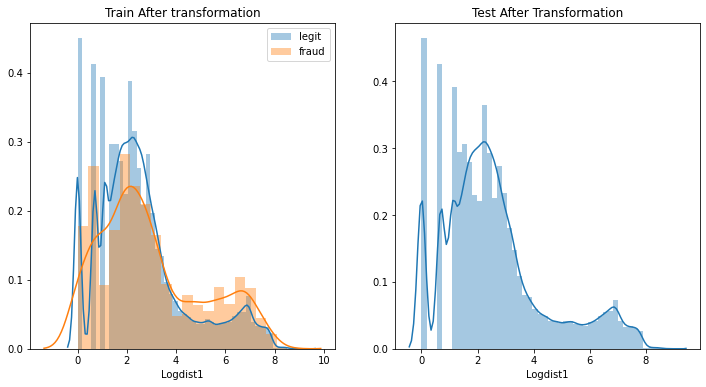

In [72]:
# plotting graph to check percentage of fraud for dist1 
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.distplot(train[train['isFraud']==0]['Logdist1'])
sns.distplot(train[train['isFraud']==1]['Logdist1'])
plt.legend(['legit','fraud'])
plt.title('Train After transformation')
plt.subplot(1,2,2)
sns.distplot(test['Logdist1'])
plt.title('Test After Transformation')

#### from above plots we see that dist1 value >4 have higher rate of fraud which specifies scammers tend to illegally swipe the card in a longer average distance from the cardholders address

In [73]:
# deleteing original columns
del train['dist1']
del test['dist1']

In [74]:
train['dist2'].describe()

count    22607.000000
mean       233.463706
std        535.992449
min          0.000000
25%          7.000000
50%         37.000000
75%        206.000000
max      11623.000000
Name: dist2, dtype: float64

In [75]:
# checking null values
print(train['dist2'].isnull().sum(axis = 0))
print(test['dist2'].isnull().sum(axis = 0))

331717
221196


C:\Users\shivam\anaconda\lib\site-packages\numpy\lib\histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\shivam\anaconda\lib\site-packages\numpy\lib\histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


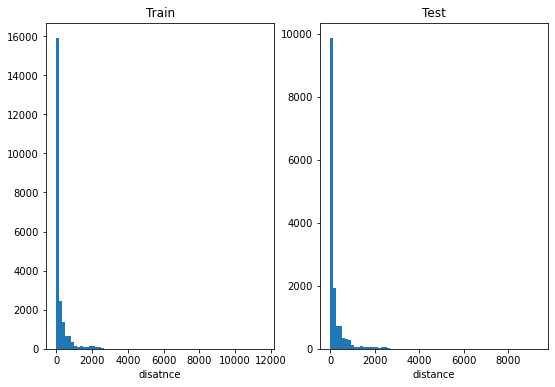

In [76]:
# plot for dist2
plt.figure(figsize=(9,6))
plt.subplot(1,2,1)
plt.hist(train['dist2'],bins=70)
plt.title('Train')
plt.xlabel("disatnce")
plt.subplot(1,2,2)
plt.hist(test['dist2'], bins=70)
plt.title('Test')
plt.xlabel("distance")
plt.show()

#### As we can see from plot dist2 is highly skewed so we need to tranform it using log tranformation

In [77]:
# transforming data using log transformation
train['Logdist2'] = np.log(train['dist2']+1)
test['Logdist2'] = np.log(test['dist2']+1)

Text(0.5, 1.0, 'Test After Transformation')

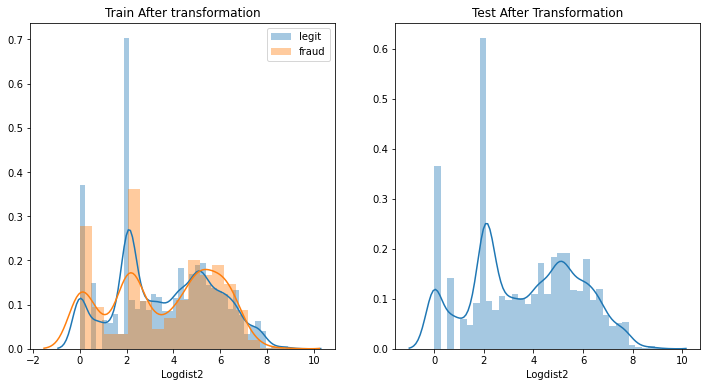

In [78]:
# plotting graph to check percentage of fraud for dist2
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.distplot(train[train['isFraud']==0]['Logdist2'])
sns.distplot(train[train['isFraud']==1]['Logdist2'])
plt.legend(['legit','fraud'])
plt.title('Train After transformation')
plt.subplot(1,2,2)
sns.distplot(test['Logdist2'])
plt.title('Test After Transformation')

#### From above plot we see tht dis2 from 5 to 7 have higher rate of fraud 

In [79]:
# deleteing original columns
del train['dist2']
del test['dist2']